# 01. Training
We will use the [Stable Baselines](https://github.com/hill-a/stable-baselines) implementation of the PPO2 algorithm.


To have a clean output, we will filter tensorflow warnings, mostly due to the migration from tf 1.x to 2.x

In [1]:
# Filter tensorflow version warnings
import os

# https://stackoverflow.com/questions/40426502/is-there-a-way-to-suppress-the-messages-tensorflow-prints/40426709
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"  # or any {'0', '1', '2'}
import warnings

# https://stackoverflow.com/questions/15777951/how-to-suppress-pandas-future-warning
warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.simplefilter(action="ignore", category=Warning)
import tensorflow as tf

tf.get_logger().setLevel("INFO")
tf.autograph.set_verbosity(0)
import logging

tf.get_logger().setLevel(logging.ERROR)

To create the environment, we use the code from the previous notebook.

In [2]:
import gym
import pandas as pd
import numpy as np

# Our custom environment Named 'IDS_Env' inherits from the 'Env' class from the 'gym' library
class IDS_Env(gym.Env):
    def __init__(self, data):
        super().__init__()
        # The class takes one parameter which is the dataset (precisely the training dataset)
        self.data = data

        # Define action and observation spaces
        self.action_space = gym.spaces.Discrete(2)  # either 0 (NORMAL) or 1 (ATTACK)
        self.observation_space = gym.spaces.Box(
            low=0, high=1, shape=(data.shape[1] - 1,), dtype=np.float64
        )

        # Define reward function
        # (true_label, action) -> reward
        self.rewards = {(0, 0): 0, (0, 1): -1, (1, 1): 1, (1, 0): -1}

        # Define the maximim episode length
        self.max_steps = 1000

        # Keep track of steps that go beyond the termination of the episode
        self.steps_beyond_done = None

    def reset(self):
        # This method should be called to start a new episode

        self.steps_beyond_done = None
        self.current_step = 0

        # start from a random point in the data
        self.i = np.random.randint(0, self.data.shape[0])

        # extarct the observation
        self.obs = self.data.iloc[self.i]

        # extract the true label of the observation
        self.label = int(self.obs.pop("label"))

        # return the observation, it should be a numpy array so the '.values' is a must
        return self.obs.values

    def step(self, action):
        # This method is called after each action the agent take

        # Verify that the action took is valid (belongs to the action space, 0 or 1)
        err_msg = "%r (%s) invalid" % (action, type(action))
        assert self.action_space.contains(action), err_msg

        # Calculate if the episode should finish
        info = {}
        done = False
        self.current_step += 1
        if self.current_step >= self.max_steps:
            done = True
            # Update the info dict to signal that the limit was exceeded
            info["reason_to_stop"] = "episode_limit"

        if self.label == 1 and action == 0:
            done = True
            # Update the info dict to signal that the agent missd an attack
            info["reason_to_stop"] = "attack_missed"

        # Calculate the reward based on the true label of the observation and the action tooked
        reward = self.rewards[(self.label, action)]

        # Calculate next state if the episode is not finished yet
        if not done:
            self.i += 1
            if self.i >= self.data.shape[0]:
                self.i = 0

            self.obs = self.data.iloc[self.i]
            self.label = int(self.obs.pop("label"))

        elif self.steps_beyond_done is None:
            self.steps_beyond_done = 0
        else:
            # Warn the user of steps after the episode termination
            if self.steps_beyond_done == 0:
                gym.logger.warn(
                    "You are calling 'step()' even though this "
                    "environment has already returned done = True. You "
                    "should always call 'reset()' once you receive 'done = "
                    "True' -- any further steps are undefined behavior."
                )
            self.steps_beyond_done += 1
            reward = 0

        # Following the 'gym' interface this method return
        # 1. the new observation (old in case of episode termination),
        # 2. the reward,
        # 3. termination of episode,
        # 4. and, an empty 'dict'.
        return self.obs.values, reward, done, info

In [3]:
# Load the training data
train_data = pd.read_csv("processed_data/train.csv")

In [4]:
train_data.head()

,bwd_packet_length_min,subflow_fwd_bytes,total_length_of_fwd_packets,fwd_packet_length_mean,bwd_packet_length_std,flow_iat_min,fwd_iat_min,flow_iat_mean,flow_duration,flow_iat_std,...,init_win_bytes_forward,ack_flag_count,fwd_psh_flags,syn_flag_count,fwd_packets/s,init_win_bytes_backward,bwd_packets/s,psh_flag_count,packet_length_mean,label
0,0.000000,2.983605e-05,2.976744e-05,0.010773,0.214847,1.250000e-07,1.666667e-08,5.974394e-02,0.716926,2.924528e-01,...,0.000015,0.0,0.0,0.0,2.324740e-08,0.003601,4.068295e-08,0.0,0.256528,1
1,0.036948,4.661882e-06,4.651163e-06,0.005050,0.000000,1.500000e-07,4.166667e-07,6.687777e-05,0.000200,1.631119e-04,...,0.000000,0.0,0.0,0.0,2.773502e-05,0.000000,4.160253e-05,0.0,0.018219,0
2,0.002072,4.661882e-07,4.651163e-07,0.001010,0.000000,3.633333e-06,8.333333e-09,3.625000e-06,0.000004,0.000000e+00,...,0.000015,1.0,0.0,0.0,7.898894e-04,0.000015,1.184834e-03,0.0,0.001798,0
3,0.023135,5.438863e-06,5.426357e-06,0.005891,0.000000,1.333333e-07,2.500000e-08,7.027777e-07,0.000002,9.844638e-07,...,0.000000,0.0,0.0,0.0,3.115265e-03,0.000000,4.672897e-03,0.0,0.014324,0
4,0.035221,6.526635e-06,6.511628e-06,0.007070,0.000000,1.416667e-07,3.333333e-08,9.166666e-07,0.000003,1.909759e-06,...,0.000000,0.0,0.0,0.0,2.290951e-03,0.000000,3.436426e-03,0.0,0.019777,0


To spped up the training process, we decided to train the algorithm on multiple environment at the same time. `stable-baselines` provides a utility for that called "*Vectorized Environments*".

In [5]:
from stable_baselines.common.vec_env import DummyVecEnv

n_envs = 16  # the best number that worked for us
env = DummyVecEnv([lambda: IDS_Env(train_data)] * n_envs)

Now, we import the PPO implementation

In [6]:
from stable_baselines import PPO2

Then, the first thing to do is define the network architecture:

In [7]:
from stable_baselines.common.policies import FeedForwardPolicy


class CustomPolicy(FeedForwardPolicy):
    def __init__(self, *args, **kwargs):
        super(CustomPolicy, self).__init__(
            *args,
            **kwargs,
            net_arch=[128, 64, 32],  # 3 layers shared between value and policy networks
            act_fun=tf.nn.relu,  # Use the ReLU activation function
            feature_extraction="mlp"
        )

We define the model with the following hyperparametrs:

In [8]:
model = PPO2(
    CustomPolicy,
    env,
    gamma=0.9,
    n_steps=512,
    ent_coef=1e-05,
    learning_rate=lambda progress: progress
    * 0.0021,  # progress decreases from 1 to 0 -> lr decreasesb from 0.0021 to 0
    vf_coef=0.6,
    max_grad_norm=0.8,
    lam=0.8,
    nminibatches=16,
    noptepochs=55,
    cliprange=0.2,
    verbose=0,
    tensorboard_log="log_25",  # define the tensorboard log location
)

Before launch the model for training, we define a callback to monitor *accuarcy* and *f1-score* for the traning and validation splits.

In [9]:
from stable_baselines.common.callbacks import BaseCallback
from sklearn.metrics import accuracy_score, f1_score
import swifter  # to speed up calculations across pandas dataframe

In [10]:
class AccF1Callback(BaseCallback):
    def __init__(self, train, val, eval_freq):
        super().__init__()
        self.train_data = train
        self.val_data = val
        self.eval_freq = eval_freq

    def _on_step(self) -> bool:

        # This method will be called by the model after each call to `env.step()`.
        # return: (bool) If the callback returns False, training is aborted early.

        if self.eval_freq > 0 and self.n_calls % self.eval_freq == 0:
            super()._on_step()

            # Calculate metrics for training data
            predicted = self.train_data.drop(columns=["label"]).swifter.apply(
                lambda x: self.model.predict(x, deterministic=True)[0], axis=1
            )
            accuracy = accuracy_score(self.train_data["label"], predicted)
            f1 = f1_score(self.train_data["label"], predicted)

            print("-" * 60)
            print(f"timesteps: {self.num_timesteps}")
            print(f"Training   >>> accuracy: {accuracy:.4f}, f1-score: {f1:.4f}")

            # Calculate metrics for validation data
            predicted = self.val_data.drop(columns=["label"]).swifter.apply(
                lambda x: self.model.predict(x, deterministic=True)[0], axis=1
            )
            accuracy = accuracy_score(self.val_data["label"], predicted)
            f1 = f1_score(self.val_data["label"], predicted)
            print(f"Validation >>> accuracy: {accuracy:.4f}, f1-score: {f1:.4f}")
            print("-" * 60)

        return True

Now, we initialize the validation callback to evaluate the model after each 20,000 steps.

In [11]:
val_data = pd.read_csv("processed_data/val.csv")
eval_callback = AccF1Callback(train_data, val_data, eval_freq=20000 // n_envs)

Finally we can start the training process where we train the model for 6,000,000 steps

In [11]:
model.learn(6000000, callback=eval_callback)

------------------------------------------------------------
timesteps: 20000
Training   >>> accuracy: 0.9543, f1-score: 0.8862
Validation >>> accuracy: 0.9543, f1-score: 0.8860
------------------------------------------------------------
------------------------------------------------------------
timesteps: 40000
Training   >>> accuracy: 0.9579, f1-score: 0.8954
Validation >>> accuracy: 0.9579, f1-score: 0.8952
------------------------------------------------------------
------------------------------------------------------------
timesteps: 60000
Training   >>> accuracy: 0.9634, f1-score: 0.9080
Validation >>> accuracy: 0.9638, f1-score: 0.9088
------------------------------------------------------------
------------------------------------------------------------
timesteps: 80000
Training   >>> accuracy: 0.9657, f1-score: 0.9141
Validation >>> accuracy: 0.9660, f1-score: 0.9146
------------------------------------------------------------
--------------------------------------------

Validation >>> accuracy: 0.9714, f1-score: 0.9304
------------------------------------------------------------
------------------------------------------------------------
timesteps: 720000
Training   >>> accuracy: 0.9735, f1-score: 0.9352
Validation >>> accuracy: 0.9739, f1-score: 0.9359
------------------------------------------------------------
------------------------------------------------------------
timesteps: 740000
Training   >>> accuracy: 0.9752, f1-score: 0.9386
Validation >>> accuracy: 0.9756, f1-score: 0.9394
------------------------------------------------------------
------------------------------------------------------------
timesteps: 760000
Training   >>> accuracy: 0.9762, f1-score: 0.9414
Validation >>> accuracy: 0.9766, f1-score: 0.9424
------------------------------------------------------------
------------------------------------------------------------
timesteps: 780000
Training   >>> accuracy: 0.9731, f1-score: 0.9344
Validation >>> accuracy: 0.9733, f1-scor

------------------------------------------------------------
timesteps: 1400000
Training   >>> accuracy: 0.9723, f1-score: 0.9329
Validation >>> accuracy: 0.9725, f1-score: 0.9333
------------------------------------------------------------
------------------------------------------------------------
timesteps: 1420000
Training   >>> accuracy: 0.9732, f1-score: 0.9351
Validation >>> accuracy: 0.9734, f1-score: 0.9355
------------------------------------------------------------
------------------------------------------------------------
timesteps: 1440000
Training   >>> accuracy: 0.9746, f1-score: 0.9375
Validation >>> accuracy: 0.9747, f1-score: 0.9376
------------------------------------------------------------
------------------------------------------------------------
timesteps: 1460000
Training   >>> accuracy: 0.9763, f1-score: 0.9418
Validation >>> accuracy: 0.9766, f1-score: 0.9424
------------------------------------------------------------
------------------------------------

------------------------------------------------------------
timesteps: 2080000
Training   >>> accuracy: 0.9719, f1-score: 0.9320
Validation >>> accuracy: 0.9718, f1-score: 0.9316
------------------------------------------------------------
------------------------------------------------------------
timesteps: 2100000
Training   >>> accuracy: 0.9755, f1-score: 0.9402
Validation >>> accuracy: 0.9756, f1-score: 0.9404
------------------------------------------------------------
------------------------------------------------------------
timesteps: 2120000
Training   >>> accuracy: 0.9782, f1-score: 0.9461
Validation >>> accuracy: 0.9784, f1-score: 0.9465
------------------------------------------------------------
------------------------------------------------------------
timesteps: 2140000
Training   >>> accuracy: 0.9765, f1-score: 0.9419
Validation >>> accuracy: 0.9765, f1-score: 0.9420
------------------------------------------------------------
------------------------------------

------------------------------------------------------------
timesteps: 2760000
Training   >>> accuracy: 0.9750, f1-score: 0.9390
Validation >>> accuracy: 0.9750, f1-score: 0.9392
------------------------------------------------------------
------------------------------------------------------------
timesteps: 2780000
Training   >>> accuracy: 0.9757, f1-score: 0.9403
Validation >>> accuracy: 0.9758, f1-score: 0.9404
------------------------------------------------------------
------------------------------------------------------------
timesteps: 2800000
Training   >>> accuracy: 0.9753, f1-score: 0.9392
Validation >>> accuracy: 0.9753, f1-score: 0.9392
------------------------------------------------------------
------------------------------------------------------------
timesteps: 2820000
Training   >>> accuracy: 0.9754, f1-score: 0.9396
Validation >>> accuracy: 0.9756, f1-score: 0.9402
------------------------------------------------------------
------------------------------------

------------------------------------------------------------
timesteps: 3440000
Training   >>> accuracy: 0.9787, f1-score: 0.9475
Validation >>> accuracy: 0.9787, f1-score: 0.9475
------------------------------------------------------------
------------------------------------------------------------
timesteps: 3460000
Training   >>> accuracy: 0.9795, f1-score: 0.9495
Validation >>> accuracy: 0.9794, f1-score: 0.9493
------------------------------------------------------------
------------------------------------------------------------
timesteps: 3480000
Training   >>> accuracy: 0.9790, f1-score: 0.9480
Validation >>> accuracy: 0.9791, f1-score: 0.9482
------------------------------------------------------------
------------------------------------------------------------
timesteps: 3500000
Training   >>> accuracy: 0.9794, f1-score: 0.9491
Validation >>> accuracy: 0.9796, f1-score: 0.9495
------------------------------------------------------------
------------------------------------

------------------------------------------------------------
timesteps: 4120000
Training   >>> accuracy: 0.9790, f1-score: 0.9481
Validation >>> accuracy: 0.9790, f1-score: 0.9480
------------------------------------------------------------
------------------------------------------------------------
timesteps: 4140000
Training   >>> accuracy: 0.9787, f1-score: 0.9472
Validation >>> accuracy: 0.9786, f1-score: 0.9469
------------------------------------------------------------
------------------------------------------------------------
timesteps: 4160000
Training   >>> accuracy: 0.9791, f1-score: 0.9483
Validation >>> accuracy: 0.9790, f1-score: 0.9480
------------------------------------------------------------
------------------------------------------------------------
timesteps: 4180000
Training   >>> accuracy: 0.9783, f1-score: 0.9461
Validation >>> accuracy: 0.9783, f1-score: 0.9460
------------------------------------------------------------
------------------------------------

------------------------------------------------------------
timesteps: 4800000
Training   >>> accuracy: 0.9833, f1-score: 0.9583
Validation >>> accuracy: 0.9834, f1-score: 0.9584
------------------------------------------------------------
------------------------------------------------------------
timesteps: 4820000
Training   >>> accuracy: 0.9876, f1-score: 0.9687
Validation >>> accuracy: 0.9875, f1-score: 0.9686
------------------------------------------------------------
------------------------------------------------------------
timesteps: 4840000
Training   >>> accuracy: 0.9836, f1-score: 0.9592
Validation >>> accuracy: 0.9837, f1-score: 0.9592
------------------------------------------------------------
------------------------------------------------------------
timesteps: 4860000
Training   >>> accuracy: 0.9873, f1-score: 0.9677
Validation >>> accuracy: 0.9874, f1-score: 0.9679
------------------------------------------------------------
------------------------------------

------------------------------------------------------------
timesteps: 5480000
Training   >>> accuracy: 0.9912, f1-score: 0.9777
Validation >>> accuracy: 0.9912, f1-score: 0.9775
------------------------------------------------------------
------------------------------------------------------------
timesteps: 5500000
Training   >>> accuracy: 0.9913, f1-score: 0.9778
Validation >>> accuracy: 0.9913, f1-score: 0.9777
------------------------------------------------------------
------------------------------------------------------------
timesteps: 5520000
Training   >>> accuracy: 0.9909, f1-score: 0.9769
Validation >>> accuracy: 0.9908, f1-score: 0.9767
------------------------------------------------------------
------------------------------------------------------------
timesteps: 5540000
Training   >>> accuracy: 0.9914, f1-score: 0.9782
Validation >>> accuracy: 0.9914, f1-score: 0.9781
------------------------------------------------------------
------------------------------------

Save the model:

In [14]:
model.save('ids_drl_model')

# 02. Evaluation

In [12]:
# load the saved model
model = PPO2.load("ids_drl_model.zip")

As in notebook 02, we can test the model for 10 episodes and see that the model perform better.

In [13]:
env = env.envs[0]
all_rewards = []
all_lengths = []
for i in range(10):
    print("-" * 50)
    print(f"Episode {i+1:02}")
    print("-" * 50)

    ep_reward = 0
    obs = env.reset()
    done = False
    while not done:
        t_label = env.label
        action = model.predict(obs, deterministic=True)[0]
        obs, rew, done, info = env.step(action)

        print(
            f"true_label: {t_label}, action: {action}, reward: {rew:>2}, done: {done}, {info}"
        )
        ep_reward += rew
    print(f"\n>>Episode reward: {ep_reward}")
    print("-" * 50)
    all_rewards.append(ep_reward)
    all_lengths.append(env.current_step)

print("\nRewards", all_rewards)
print(f"Mean Episodes Reward: {np.mean(all_rewards)}")
print("\nLengths", all_lengths)
print(f"Mean Episodes Length: {np.mean(all_lengths)}")

--------------------------------------------------
Episode 01
--------------------------------------------------
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 1, action: 1, reward:  1, done: False, {}
true_label: 1, action: 1, reward:  1, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 

true_label: 1, action: 1, reward:  1, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 1, action: 1, reward:  1, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 1, action: 1, re

true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 1, action: 1, reward:  1, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, re

true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 1, action: 1, reward:  1, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 1, action: 1, reward:  1, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 1, action: 1, re

true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 1, action: 1, reward:  1, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 0, action: 0, reward:  0, done: False, {}
true_label: 1, action: 1, re

Because we have used a dataset,we can compute the different metrics and compare it with other researchers' work.

In [15]:
from sklearn.metrics import (
    precision_score,
    recall_score,
    balanced_accuracy_score,
    confusion_matrix,
)

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

### 01. Results on training data

In [14]:
pred = train_data.drop(columns=["label"]).swifter.apply(
    lambda x: model.predict(x, deterministic=True)[0], axis=1
)

print("accuarcy:", accuracy_score(train_data["label"], pred))
print("recall:", recall_score(train_data["label"], pred))
print("precision:", precision_score(train_data["label"], pred))
print("f1-score:", f1_score(train_data["label"], pred))
print("balanced accuarcy:", balanced_accuracy_score(train_data["label"], pred))

print("\nConfusion matrix:")
cm = confusion_matrix(train_data["label"], pred)
df_cm = pd.DataFrame(cm, columns=["normal", "attack"], index=["normal", "attack"])
df_cm.index.name = "Actual"
df_cm.columns.name = "Predicted"

plt.figure(figsize=(10, 7))
sns.heatmap(df_cm, cmap="Blues", annot=True, fmt="g")

accuarcy: 0.9920307872519117


NameError: name 'recall_score' is not defined

accuarcy: 0.9919798577025899
recall: 0.9803110760288472
precision: 0.9790289348741378
f1-score: 0.9796695859515763
balanced accuarcy: 0.9875778665293501

Confusion matrix:


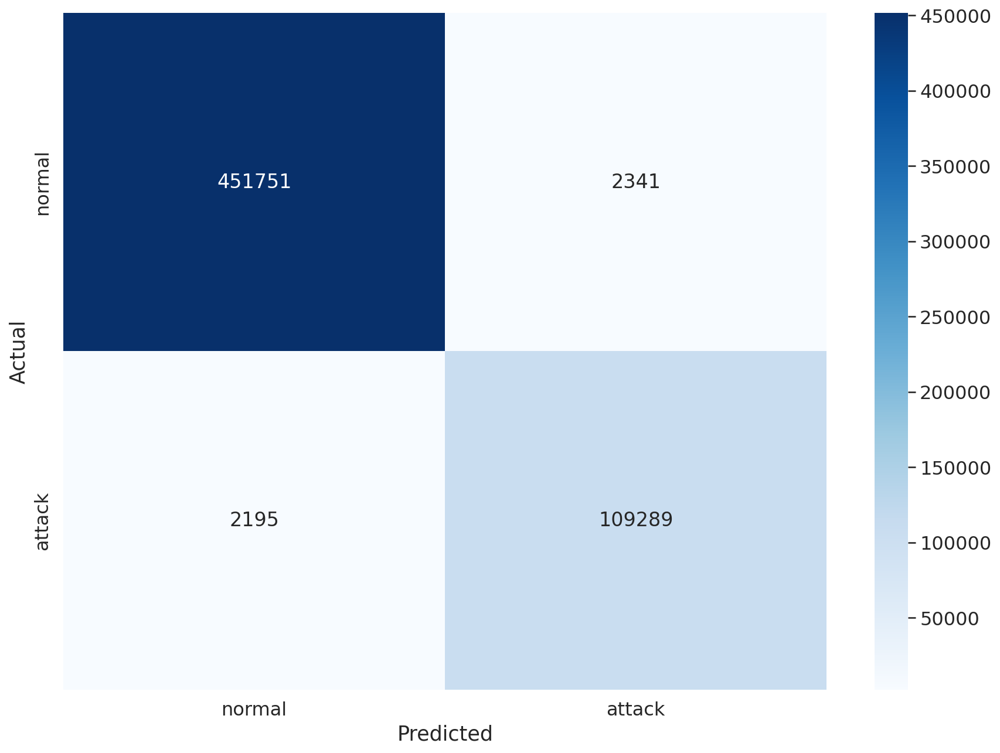

In [34]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, balanced_accuracy_score, confusion_matrix

# Assuming 'test_data' and 'model' are already defined
pred = test_data.drop(columns=["label"]).swifter.apply(
    lambda x: model.predict(x, deterministic=True)[0], axis=1
)

print("accuarcy:", accuracy_score(test_data["label"], pred))
print("recall:", recall_score(test_data["label"], pred))
print("precision:", precision_score(test_data["label"], pred))
print("f1-score:", f1_score(test_data["label"], pred))
print("balanced accuarcy:", balanced_accuracy_score(test_data["label"], pred))

print("\nConfusion matrix:")
cm = confusion_matrix(test_data["label"], pred)
df_cm = pd.DataFrame(cm, columns=["normal", "attack"], index=["normal", "attack"])
df_cm.index.name = "Actual"
df_cm.columns.name = "Predicted"

plt.figure(figsize=(14, 10), dpi=150)  # Increase figure size and dpi for better quality
sns.set(font_scale=1.4)  # Increase font size for better readability
sns.heatmap(df_cm, cmap="Blues", annot=True, fmt="g", annot_kws={"size": 16})  # Increase annotation size

# Save the high-quality figure
plt.savefig("confusion_matrix_high_quality.png", dpi=300, bbox_inches="tight")

# Show the plot
plt.show()


### 02. Results on validitaion data

accuarcy: 0.9921296910224108
recall: 0.9816731543775172
precision: 0.978338135868773
f1-score: 0.9800028078056998
balanced accuarcy: 0.9881796215208616

Confusion matrix:


<AxesSubplot:xlabel='Predicted', ylabel='Actual'>

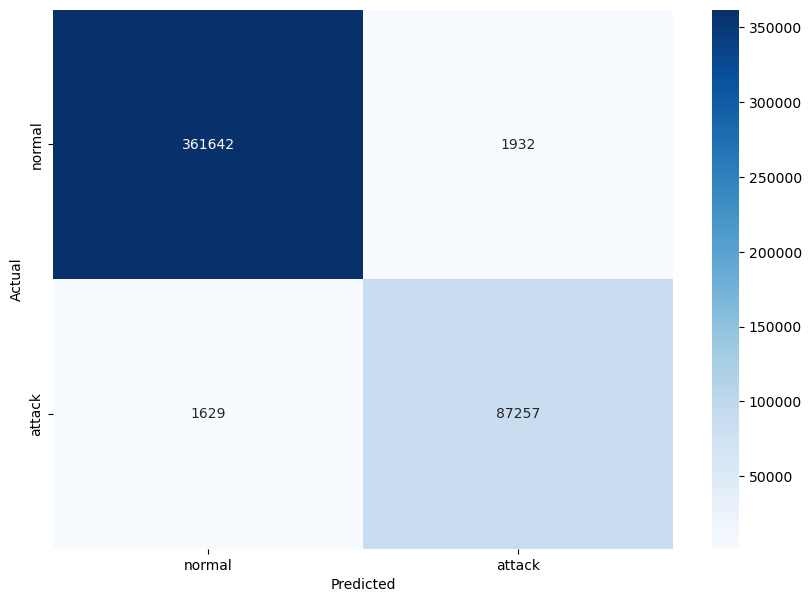

In [18]:
pred = val_data.drop(columns=["label"]).swifter.apply(
    lambda x: model.predict(x, deterministic=True)[0], axis=1
)

print("accuarcy:", accuracy_score(val_data["label"], pred))
print("recall:", recall_score(val_data["label"], pred))
print("precision:", precision_score(val_data["label"], pred))
print("f1-score:", f1_score(val_data["label"], pred))
print("balanced accuarcy:", balanced_accuracy_score(val_data["label"], pred))

print("\nConfusion matrix:")
cm = confusion_matrix(val_data["label"], pred)
df_cm = pd.DataFrame(cm, columns=["normal", "attack"], index=["normal", "attack"])
df_cm.index.name = "Actual"
df_cm.columns.name = "Predicted"

plt.figure(figsize=(10, 7))
sns.heatmap(df_cm, cmap="Blues", annot=True, fmt="g")

### 03. Results on test data

In [38]:
test_data = pd.read_csv("processed_data/test.csv")

accuarcy: 0.9919798577025899
recall: 0.9803110760288472
precision: 0.9790289348741378
f1-score: 0.9796695859515763
balanced accuarcy: 0.9875778665293501

Confusion matrix:


<AxesSubplot:xlabel='Predicted', ylabel='Actual'>

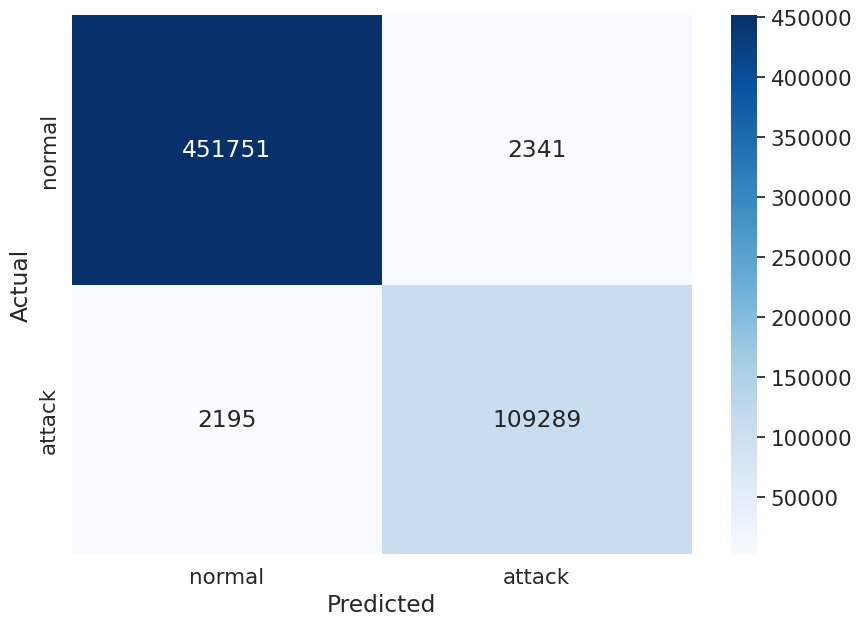

In [39]:
pred = test_data.drop(columns=["label"]).swifter.apply(
    lambda x: model.predict(x, deterministic=True)[0], axis=1
)

print("accuarcy:", accuracy_score(test_data["label"], pred))
print("recall:", recall_score(test_data["label"], pred))
print("precision:", precision_score(test_data["label"], pred))
print("f1-score:", f1_score(test_data["label"], pred))
print("balanced accuarcy:", balanced_accuracy_score(test_data["label"], pred))

print("\nConfusion matrix:")
cm = confusion_matrix(test_data["label"], pred)
df_cm = pd.DataFrame(cm, columns=["normal", "attack"], index=["normal", "attack"])
df_cm.index.name = "Actual"
df_cm.columns.name = "Predicted"

plt.figure(figsize=(10, 7))
sns.heatmap(df_cm, cmap="Blues", annot=True, fmt="g")

### 04. ROC and PR on test data:

In [21]:
from sklearn.metrics import (
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score,
)

In [22]:
# Calculate the scores
scores = test_data.drop(columns=["label"]).swifter.apply(
    lambda x: model.action_probability(x)[1], axis=1
)

Pandas Apply:   0%|          | 0/565576 [00:00<?, ?it/s]

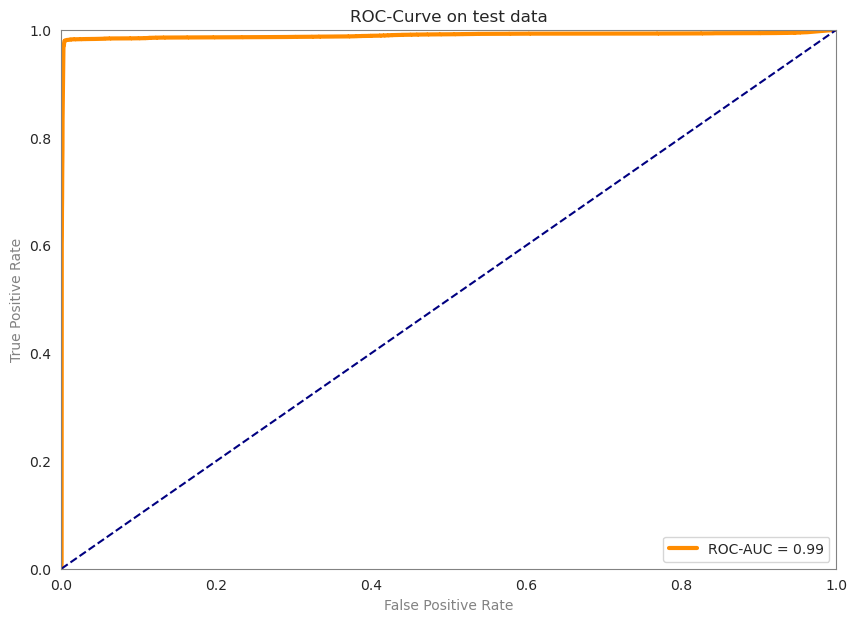

In [25]:
fpr, tpr, _ = roc_curve(test_data["label"], scores)
roc_auc = auc(fpr, tpr)

sns.set_style("white")
fig, ax = plt.subplots(1, 1, figsize=(10, 7))
plt.plot(fpr, tpr, color="darkorange", lw=3, label="ROC-AUC = %0.2f" % roc_auc)
plt.plot([0, 1], [0, 1], color="navy", linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC-Curve on test data")
plt.legend(loc="lower right")

ax.spines["bottom"].set_color("#828282")
ax.spines["left"].set_color("#828282")
ax.spines["right"].set_color("#828282")
ax.spines["top"].set_color("#828282")

ax.yaxis.label.set_color("#828282")
ax.xaxis.label.set_color("#828282")
plt.show()

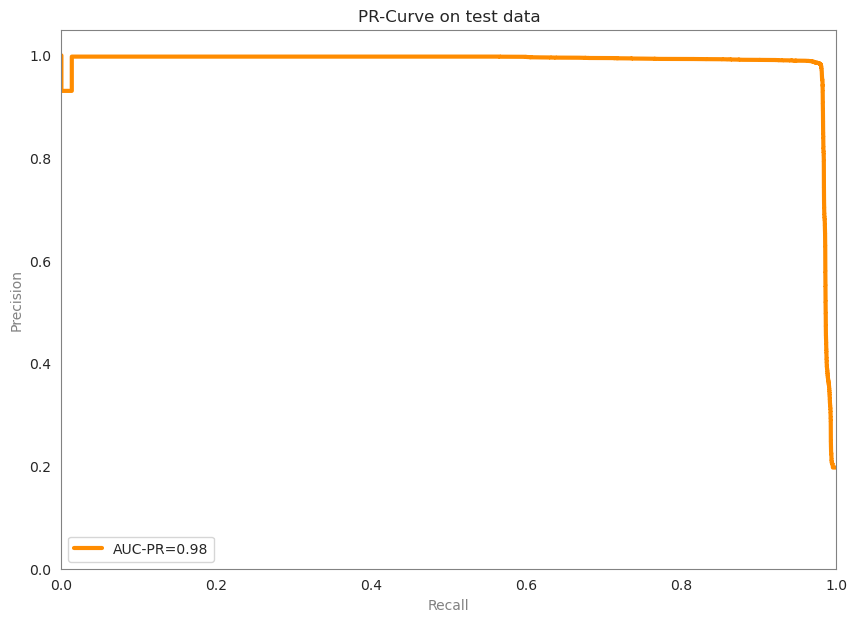

In [26]:
precisions, recalls, thresholds = precision_recall_curve(test_data["label"], scores)
average_prec = average_precision_score(test_data["label"], scores)

fig, ax = plt.subplots(1, 1, figsize=(10, 7))
plt.step(
    recalls,
    precisions,
    where="post",
    lw=3,
    color="darkorange",
    label="AUC-PR={0:0.2f}".format(average_prec),
)

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("PR-Curve on test data")

plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.legend()

ax.spines["bottom"].set_color("#828282")
ax.spines["left"].set_color("#828282")
ax.spines["right"].set_color("#828282")
ax.spines["top"].set_color("#828282")
ax.yaxis.label.set_color("#828282")
ax.xaxis.label.set_color("#828282")

plt.show()

Shape of observations: (1000, 23)


  0%|          | 0/1000 [00:00<?, ?it/s]

Output 0:


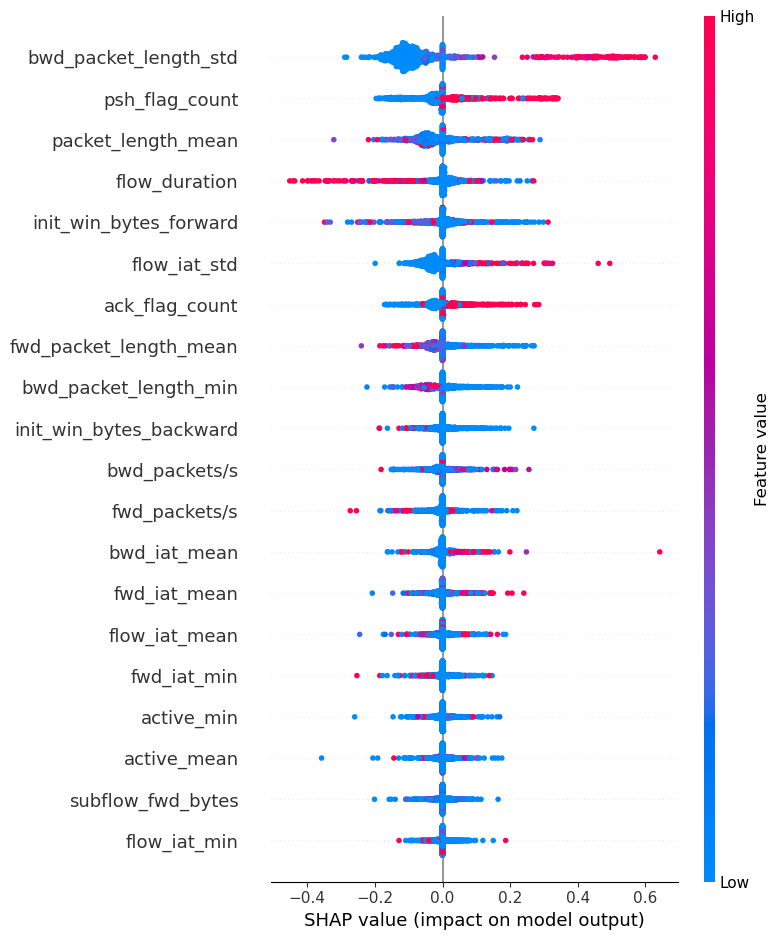

In [48]:
import shap
import numpy as np

# Assuming you have a list of your actual feature names
feature_names = ['bwd_packet_length_min', 'subflow_fwd_bytes', 'total_length_of_fwd_packets', 'fwd_packet_length_mean', 'bwd_packet_length_std', 'flow_iat_min', 'fwd_iat_min', 'flow_iat_mean', 'flow_duration', 'flow_iat_std', 'active_min', 'active_mean', 'bwd_iat_mean', 'fwd_iat_mean', 'init_win_bytes_forward', 'ack_flag_count', 'fwd_psh_flags', 'syn_flag_count', 'fwd_packets/s', 'init_win_bytes_backward', 'bwd_packets/s', 'psh_flag_count', 'packet_length_mean']

# Collect some data from the first environment for SHAP
observations = []
actions = []
obs = env.envs[0].reset()  # Reset the first environment
for _ in range(1000):
    action, _ = model.predict(obs)
    observations.append(obs)  # Store the observation as it is
    actions.append(action)
    obs, _, done, _ = env.envs[0].step(action)
    if isinstance(done, np.ndarray):
        done = done.any()
    if done:
        obs = env.envs[0].reset()

observations = np.array(observations)
actions = np.array(actions)

# Verify the shape of the observations
print("Shape of observations:", observations.shape)  # Ensure this matches the expected shape (1000, 23)

# Sample a subset of the observations to use as background data for SHAP
sample_size = 50  # Adjust the sample size to reduce computation time
indices = np.random.choice(observations.shape[0], sample_size, replace=False)
background_samples = observations[indices]

def policy_predict(observations):
    actions = []
    for obs in observations:
        obs = obs.reshape((1, -1))  # Reshape observation to fit the model input
        action, _ = model.predict(obs, deterministic=True)  # Use deterministic actions for SHAP
        actions.append(action)
    return np.array(actions)

# Use KernelExplainer with a smaller background sample
explainer = shap.KernelExplainer(policy_predict, background_samples)
shap_values = explainer.shap_values(observations, nsamples=100)  # Limit number of samples to reduce time

# Check if the model is multi-output
if isinstance(shap_values, list):
    for i, sv in enumerate(shap_values):
        print(f"Output {i}:")
        shap.summary_plot(sv, observations, feature_names=feature_names, plot_type="dot", show=False)
else:
    # Generate the detailed SHAP summary plot for single output
    shap.summary_plot(shap_values, observations, feature_names=feature_names, plot_type="dot")


In [24]:
import lime
import lime.lime_tabular
import numpy as np
import pandas as pd

# Load the training data
train_data = pd.read_csv("processed_data/train.csv")

# Extract feature names from the first 23 columns of the dataset
feature_names = train_data.columns[:23].tolist()

# Verify the shape of the training data
print("Training data shape:", train_data[feature_names].values.shape)
print("Feature names:", feature_names)

# Assuming your model and env have already been defined as per your existing script

# Prepare the LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=train_data[feature_names].values,
    feature_names=feature_names,
    class_names=['normal', 'attack'],
    mode='classification'
)

# Function to predict the probabilities for LIME
def lime_predict_fn(data):
    # Predict the probabilities for each class
    probs = []
    for instance in data:
        instance = instance.reshape(1, -1)
        prob = model.action_probability(instance)
        probs.append(prob[0])
    return np.array(probs)

# Collect some data from the environment for LIME explanation
observations = []
obs = env.reset()  # Reset the first environment
for _ in range(10):  # Limiting to 10 observations for brevity
    action, _ = model.predict(obs)
    observations.append(obs)  # Store the observation as it is
    obs, _, done, _ = env.step(action)
    if isinstance(done, np.ndarray):
        done = done.any()
    if done:
        obs = env.reset()

observations = np.array(observations)

# Verify the shape of the collected observations
print("Collected observations shape:", observations.shape)

# Since we have a shape of (10, 16, 23), we need to select the first step (0 index) from the 16 steps for each observation.
# We reshape it to (10, 23).
observations = observations[:, 0, :]

# Verify the new shape of the collected observations
print("Reshaped observations shape:", observations.shape)

# Ensure each observation is a 1-dimensional array
# Generate LIME explanations for the collected observations
for i, obs in enumerate(observations):
    print(f"Explaining observation {i}:")
    exp = explainer.explain_instance(obs, lime_predict_fn, num_features=10)
    exp.show_in_notebook(show_table=True)


Training data shape: (1809840, 23)
Feature names: ['bwd_packet_length_min', 'subflow_fwd_bytes', 'total_length_of_fwd_packets', 'fwd_packet_length_mean', 'bwd_packet_length_std', 'flow_iat_min', 'fwd_iat_min', 'flow_iat_mean', 'flow_duration', 'flow_iat_std', 'active_min', 'active_mean', 'bwd_iat_mean', 'fwd_iat_mean', 'init_win_bytes_forward', 'ack_flag_count', 'fwd_psh_flags', 'syn_flag_count', 'fwd_packets/s', 'init_win_bytes_backward', 'bwd_packets/s', 'psh_flag_count', 'packet_length_mean']
Collected observations shape: (10, 16, 23)
Reshaped observations shape: (10, 23)
Explaining observation 0:


Explaining observation 1:


Explaining observation 2:


Explaining observation 3:


Explaining observation 4:


Explaining observation 5:


Explaining observation 6:


Explaining observation 7:


Explaining observation 8:


Explaining observation 9:


/home/ekramul/miniconda3/envs/ids_drl/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/ekramul/miniconda3/envs/ids_drl/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/ekramul/miniconda3/envs/ids_drl/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/ekramul/miniconda3/envs/ids_drl

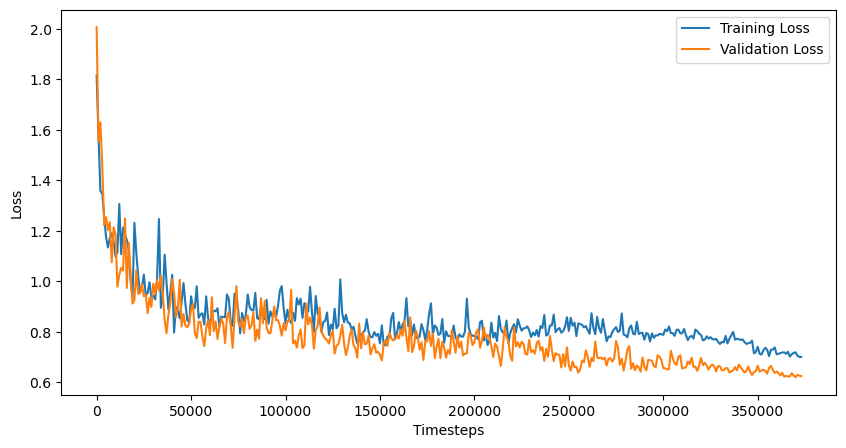

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from stable_baselines.common.callbacks import BaseCallback
from sklearn.metrics import log_loss
import pandas as pd

class LossCallback(BaseCallback):
    def __init__(self, train_data, val_data, eval_freq=1000):
        super(LossCallback, self).__init__()
        self.train_data = train_data
        self.val_data = val_data
        self.eval_freq = eval_freq
        self.train_losses = []
        self.val_losses = []

    def _on_step(self) -> bool:
        if self.n_calls % self.eval_freq == 0:
            # Predict on training data
            train_pred = self.model.predict(self.train_data.drop(columns=["label"]).values, deterministic=True)[0]
            train_loss = log_loss(self.train_data["label"], train_pred)
            self.train_losses.append(train_loss)

            # Predict on validation data
            val_pred = self.model.predict(self.val_data.drop(columns=["label"]).values, deterministic=True)[0]
            val_loss = log_loss(self.val_data["label"], val_pred)
            self.val_losses.append(val_loss)

            print(f"Step {self.n_calls}: Training Loss = {train_loss:.4f}, Validation Loss = {val_loss:.4f}")

        return True

    def on_training_end(self):
        # Save losses when training ends
        np.save('train_losses.npy', self.train_losses)
        np.save('val_losses.npy', self.val_losses)

    def plot_losses(self, train_color='green', val_color='red'):
        plt.figure(figsize=(10, 5))
        plt.plot(np.arange(len(self.train_losses)) * self.eval_freq, self.train_losses, label="Training Loss", color=train_color)
        plt.plot(np.arange(len(self.val_losses)) * self.eval_freq, self.val_losses, label="Validation Loss", color=val_color)
        plt.xlabel("Timesteps")
        plt.ylabel("Loss")
        plt.legend()
        plt.show()


# Load previously saved losses (if available)
try:
    train_losses = np.load('train_losses.npy')
    val_losses = np.load('val_losses.npy')
    plt.figure(figsize=(10, 5))
    plt.plot(np.arange(len(train_losses)) * 1000, train_losses, label="Training Loss")
    plt.plot(np.arange(len(val_losses)) * 1000, val_losses, label="Validation Loss")
    plt.xlabel("Timesteps")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()
except FileNotFoundError:
    print("No saved losses found. Starting training...")

    # Initialize the environment and the PPO model as before
    env = DummyVecEnv([lambda: IDS_Env(train_data)] * n_envs)
    model = PPO2(
        CustomPolicy,
        env,
        gamma=0.9,
        n_steps=512,
        ent_coef=1e-05,
        learning_rate=lambda progress: progress * 0.0021,
        vf_coef=0.6,
        max_grad_norm=0.8,
        lam=0.8,
        nminibatches=16,
        noptepochs=55,
        cliprange=0.2,
        verbose=0,
        tensorboard_log="log_25",
    )

    # Prepare the callback
    val_data = pd.read_csv("processed_data/val.csv")
    loss_callback = LossCallback(train_data, val_data, eval_freq=1000)

    # Train the model
    model.learn(total_timesteps=6000000, callback=loss_callback)

    # Plot the losses
    loss_callback.plot_losses(train_color='green', val_color='red')



In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming train_losses and test_losses are already loaded
try:
    train_losses = np.load('train_losses.npy')
    test_losses = np.load('test_losses.npy')

    # Plot Training and Test Loss on the same plot
    plt.figure(figsize=(10, 5))
    plt.plot(np.arange(len(train_losses)) * 1000, train_losses, label="Training Loss", color='blue', linestyle='-', linewidth=2)
    plt.plot(np.arange(len(test_losses)) * 1000, test_losses, label="Test Loss", color='red', linestyle='--', linewidth=2)
    
    # Set x-axis and y-axis limits to zoom in
    plt.xlim(0, 100000)  # Adjust these values to zoom in on the x-axis
    plt.ylim(0.75, 1.2)  # Adjust these values to zoom in on the y-axis
    
    plt.xlabel("Timesteps")
    plt.ylabel("Loss")
    plt.title("Training and Test Loss Over Time")
    plt.legend()
    plt.show()

except FileNotFoundError:
    print("No saved losses found. Make sure you have trained the model and saved the losses.")


  0%|          | 0/1 [00:00<?, ?it/s]

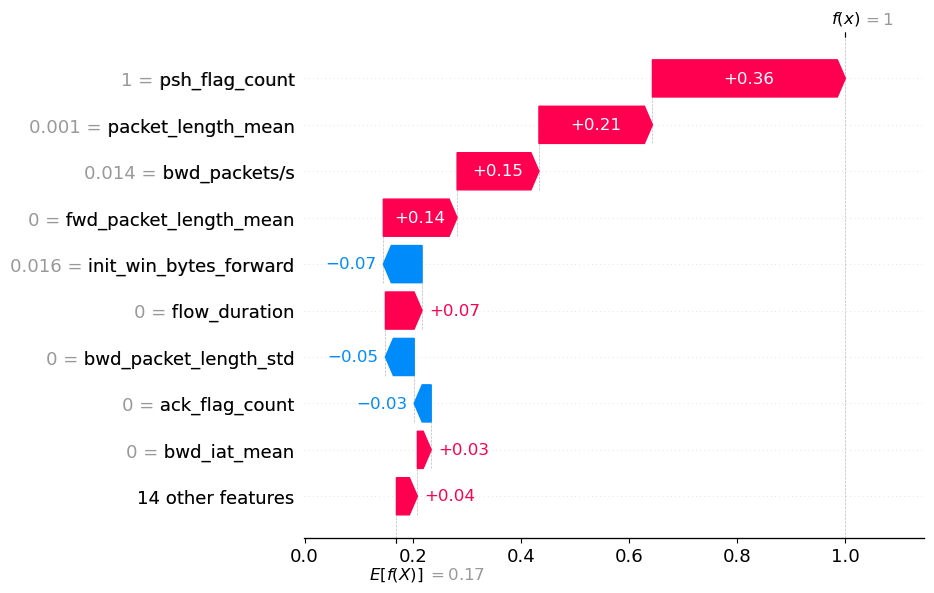

In [21]:
import shap
import numpy as np
import pandas as pd
from stable_baselines import PPO2

# Load your trained PPO2 model and test data
model = PPO2.load("ids_drl_model.zip")  # Load your trained PPO2 model
test_data = pd.read_csv("processed_data/test.csv")  # Load your test dataset
X_test = test_data.drop(columns=["label"]).values  # Extract features from the test data

# Summarize the background data to speed up SHAP calculations
background = shap.sample(X_test, 100)  # Randomly sample 100 data points for the background

# Define a function to make predictions using your PPO2 model
def ppo_predict(data):
    data = np.array(data)
    actions, _ = model.predict(data)
    return actions

# Use SHAP's KernelExplainer for model-agnostic explanation
explainer = shap.KernelExplainer(ppo_predict, background)

# Select a single instance from the test data for detailed explanation
single_instance = X_test[0:1]

# Compute SHAP values for the selected instance
shap_values = explainer.shap_values(single_instance)

# Manually create a SHAP Explanation object
shap_explanation = shap.Explanation(
    values=shap_values[0],  # SHAP values for the first instance
    base_values=explainer.expected_value,  # Expected base value
    data=single_instance[0],  # Input instance data
    feature_names=test_data.drop(columns=["label"]).columns.tolist()  # Feature names
)

# Ensure the number of features and SHAP values match
assert len(shap_explanation.values) == single_instance.shape[1], "Mismatch in feature count."

# Create a waterfall plot for the SHAP values of the selected instance
shap.waterfall_plot(shap_explanation)


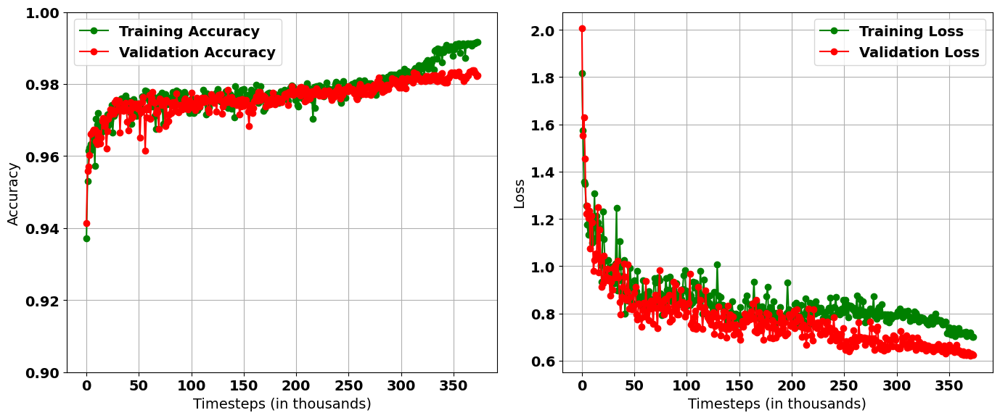

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from stable_baselines.common.callbacks import BaseCallback
from sklearn.metrics import accuracy_score, log_loss
import pandas as pd

class AccuracyLossCallback(BaseCallback):
    def __init__(self, train_data, val_data, eval_freq=1000):
        super(AccuracyLossCallback, self).__init__()
        self.train_data = train_data
        self.val_data = val_data
        self.eval_freq = eval_freq
        self.train_accuracies = []
        self.val_accuracies = []
        self.train_losses = []
        self.val_losses = []

    def _on_step(self) -> bool:
        if self.n_calls % self.eval_freq == 0:
            # Predict on training data
            train_pred = self.model.predict(self.train_data.drop(columns=["label"]).values, deterministic=True)[0]
            train_accuracy = accuracy_score(self.train_data["label"], train_pred)
            self.train_accuracies.append(train_accuracy)
            train_loss = log_loss(self.train_data["label"], train_pred)
            self.train_losses.append(train_loss)

            # Predict on validation data
            val_pred = self.model.predict(self.val_data.drop(columns=["label"]).values, deterministic=True)[0]
            val_accuracy = accuracy_score(self.val_data["label"], val_pred)
            self.val_accuracies.append(val_accuracy)
            val_loss = log_loss(self.val_data["label"], val_pred)
            self.val_losses.append(val_loss)

            print(f"Step {self.n_calls}: Training Accuracy = {train_accuracy:.4f}, Validation Accuracy = {val_accuracy:.4f}")
            print(f"Step {self.n_calls}: Training Loss = {train_loss:.4f}, Validation Loss = {val_loss:.4f}")

        return True

    def on_training_end(self):
        # Save accuracies and losses when training ends
        np.save('train_accuracies.npy', self.train_accuracies)
        np.save('val_accuracies.npy', self.val_accuracies)
        np.save('train_losses.npy', self.train_losses)
        np.save('val_losses.npy', self.val_losses)

def plot_losses_and_accuracies(train_losses, val_losses, train_accuracies, val_accuracies, eval_freq, save_path='training_validation_curves.png'):
    # Set font size and make it bold
    plt.rcParams.update({'font.size': 14, 'font.weight': 'bold'})

    plt.figure(figsize=(14, 6))

    # Convert timesteps to thousands
    timesteps = np.arange(len(train_accuracies)) * eval_freq / 1000

    # Plot accuracy
    plt.subplot(1, 2, 1)
    plt.plot(timesteps, train_accuracies, label="Training Accuracy", color='green', linestyle='-', marker='o')
    plt.plot(timesteps, val_accuracies, label="Validation Accuracy", color='red', linestyle='-', marker='o')
    plt.xlabel("Timesteps (in thousands)")
    plt.ylabel("Accuracy")
    plt.ylim(0.9, 1.0)
    plt.legend()
    plt.grid(True)

    # Plot loss
    plt.subplot(1, 2, 2)
    plt.plot(timesteps, train_losses, label="Training Loss", color='green', linestyle='-', marker='o')
    plt.plot(timesteps, val_losses, label="Validation Loss", color='red', linestyle='-', marker='o')
    plt.xlabel("Timesteps (in thousands)")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True)

    # Adjust layout and save the figure
    plt.tight_layout()
    plt.savefig(save_path, dpi=300)
    plt.show()

# Load previously saved accuracies and losses (if available)
try:
    train_accuracies = np.load('train_accuracies.npy')
    val_accuracies = np.load('val_accuracies.npy')
    train_losses = np.load('train_losses.npy')
    val_losses = np.load('val_losses.npy')

    # Plot Training and Validation Accuracy and Loss on the same plot
    plot_losses_and_accuracies(
        train_losses=train_losses,
        val_losses=val_losses,
        train_accuracies=train_accuracies,
        val_accuracies=val_accuracies,
        eval_freq=1000,
        save_path='training_validation_curves.png'
    )

except FileNotFoundError:
    print("No saved accuracies or losses found. Starting training...")

    # Initialize the environment and the PPO model as before
    env = DummyVecEnv([lambda: IDS_Env(train_data)] * n_envs)
    model = PPO2(
        CustomPolicy,
        env,
        gamma=0.9,
        n_steps=512,
        ent_coef=1e-05,
        learning_rate=lambda progress: progress * 0.0021,
        vf_coef=0.6,
        max_grad_norm=0.8,
        lam=0.8,
        nminibatches=16,
        noptepochs=55,
        cliprange=0.2,
        verbose=0,
        tensorboard_log="log_25",
    )

    # Prepare the callback
    val_data = pd.read_csv("processed_data/val.csv")
    accuracy_loss_callback = AccuracyLossCallback(train_data, val_data, eval_freq=1000)

    # Train the model
    model.learn(total_timesteps=6000000, callback=accuracy_loss_callback)

    # Plot the accuracies and losses
    plot_losses_and_accuracies(
        train_losses=accuracy_loss_callback.train_losses,
        val_losses=accuracy_loss_callback.val_losses,
        train_accuracies=accuracy_loss_callback.train_accuracies,
        val_accuracies=accuracy_loss_callback.val_accuracies,
        eval_freq=1000,
        save_path='training_validation_curves.png'
    )
